#### Boot cell

Skip if `module_update.py` is in same folder as notebook, next cell downloads this file which in turn will download other files.

In [1]:
! curl -s "https://raw.githubusercontent.com/Yoonsen/Modules/master/module_update.py" > "module_update.py"

#### Get essentials

Import text and graph modules for analysis, and css for display

In [2]:
from module_update import update, css, code_toggle, printmd

In [3]:
css()

### Start med å importere modulene

In [4]:
update('graph_networkx_louvain', overwrite=True)
update('nbtext', overwrite=True)
import nbtext as nb
import graph_networkx_louvain as gnl
import networkx as nx
from graph_networkx_louvain import cutdown, make_collocation_graph
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

Updated file `D:\Documents\GitHub\Miscellaneous-Notebooks\graph_networkx_louvain.py`

Updated file `D:\Documents\GitHub\Miscellaneous-Notebooks\nbtext.py`

In [5]:
import requests

def ngram(word, corpus='bok', period=(1800, 2000)):
    r = requests.get("https://api.nb.no/ngram/ngram", 
                     params =
                     {
                         'word':word, 
                         'corpus':corpus,
                         'yearfrom':period[0],
                         'yearto':period[1]
                     })
    return r.json()
    

In [13]:
s = ngram('Norden', period=(2000, 2020))

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [ ]:
nb.frame(dict(s)).plot()

In [8]:
ska = ngram('Skandinavia', period=(1750, 1920))
sken = ngram('Skandinavien', period = (1750, 1920))


In [9]:
scen = ngram('Scandinavien', period = (1750, 1920))

In [12]:
sk = pd.DataFrame()
sk['ska'] = pd.Series(dict(ska))
sk['sken'] = pd.Series(dict(sken))
sk['scen'] = pd.Series(dict(scen))

In [13]:
SN = pd.DataFrame()
SN['Norden'] = pd.Series(dict(s))
SN['Skandinavien'] = sk.fillna(0).sum(axis=1)

In [14]:
sk

,ska,sken,scen
1771,7,107.0,2.0
1809,1,NaN,NaN
1812,1,1.0,NaN
1814,4,6.0,1.0
1820,1,3.0,1.0
1821,1,13.0,28.0
1824,1,6.0,NaN
1828,1,1.0,NaN
1830,3,2.0,NaN
1833,1,10.0,1.0


In [15]:
SN

,Norden,Skandinavien
1750,185,NaN
1751,72,NaN
1752,61,NaN
1753,255,NaN
1754,48,NaN
1755,27,NaN
1756,11,NaN
1757,322,NaN
1758,72,NaN
1759,145,NaN


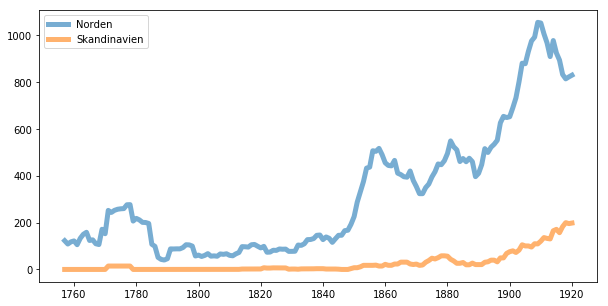

In [16]:
SN.fillna(0).rolling(window=8).mean().plot(figsize=(10,5), lw=5, alpha = 0.60)
plt.savefig('norden-skandinavien.jpg', dpi=300)

# Aggregerte data, trendlinjer og ordmodeller fra ngram




### Trendlinjer 

Data inntil trigram.

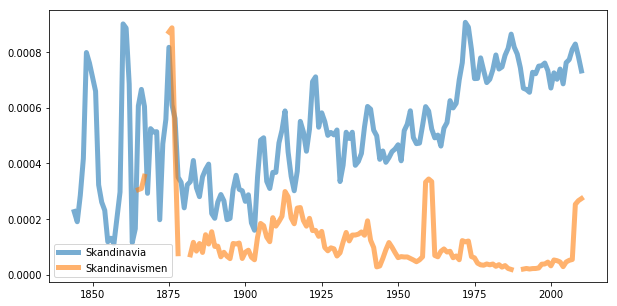

In [154]:
n = nb.nb_ngram("Norden",  years=(1840, 2010), smooth=1)['Norden']
s = nb.nb_ngram("skandinavia, skandinavien", years=(1840, 2010), smooth=1).sum(axis=1)  
sv = nb.nb_ngram("skandinavisme, skandinavismen", years=(1840, 2010), smooth=1).sum(axis=1)
sn = pd.DataFrame()
#sn['Norden'] = n
sn['Skandinavia'] = s
sn['Skandinavismen'] = sv
sn.rolling(window=3).mean().plot(figsize=(10,5), lw=5, alpha = 0.60)
plt.savefig('norden-skandinavia.jpg', dpi=300)

In [191]:
x = nb.nb_ngram("Ytringsfrihet, Ytringsfrihed", 
            years=(1820, 2010), smooth=1, corpus='avis')
y = nb.nb_ngram("offentlighet, offentlighed",  corpus='avis', years=(1820, 2010), smooth=1)
df = pd.DataFrame()
df['Ytringsfrihet'] = x.sum(axis = 1)
df['Offentlighet'] = y.sum(axis = 1)

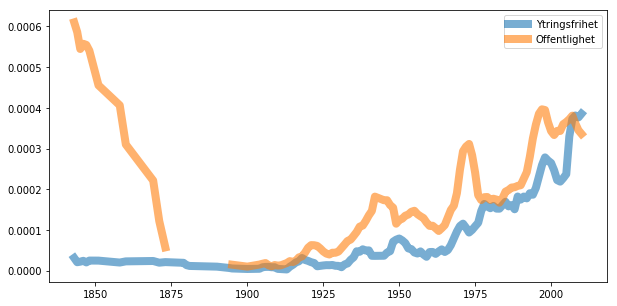

In [192]:
df.rolling(window=5).mean().plot(figsize=(10,5), lw=8, alpha = 0.60)
plt.savefig('ytring-offentlighet-avis.jpg', dpi=300)

In [193]:
x = nb.nb_ngram("Ytringsfrihet, Ytringsfrihed", 
            years=(1820, 2010), smooth=12)
y = nb.nb_ngram("offentlighet, offentlighed",  years=(1820, 2010), smooth=12)
df = pd.DataFrame()
df['Ytringsfrihet'] = x.sum(axis = 1)
df['Offentlighet'] = y.sum(axis = 1)

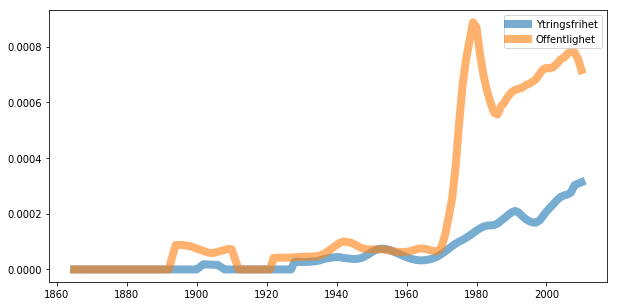

In [194]:
df.plot(figsize=(10,5), lw=8, alpha = 0.60)
plt.savefig('ytring-offentlighet-bok.jpg', dpi=300)

### Ordmodeller

Enkeltord - kapitaliseringssensitiv

In [91]:
a = nb.serie_cluster('offentlighet',1960, 1990, 4)

1960 1963
1964 1967
1968 1971
1972 1975
1976 1979
1980 1983
1984 1987
1988 1991


In [217]:
Off = nb.Cluster('Offentlighed', period=(1800, 1900))

In [18]:
clustre = dict()

In [19]:
def make_cluster(word, period, corpus, before=5, after= 5):
    clustre[(word, period),corpus] = nb.Cluster(word, period=period, corpus=corpus, before=before, after=after)
    return "Done"

In [10]:
make_cluster('Offentlighed', period=(1800, 1900), corpus='bok')

'Done'

In [20]:
make_cluster('Trykkefrihed', period=(1800, 1900), corpus='bok')

'Done'

In [13]:
make_cluster('Pressefrihed', period=(1800, 1900), corpus='bok')

'Done'

In [12]:
make_cluster('Ytringsfrihed', period=(1800, 1900), corpus='bok')

'Done'

In [14]:
make_cluster('Offentlighed', period=(1800, 1900), corpus='avis')

'Done'

In [24]:
make_cluster('Trykkefrihed', period=(1800, 1900), corpus='avis')

'Done'

In [16]:
make_cluster('Pressefrihed', period=(1800, 1900), corpus='avis')

'Done'

In [17]:
make_cluster('Ytringsfrihed', period=(1800, 1900), corpus='avis')

'Done'

In [18]:
make_cluster('Offentlighed', period=(1800, 1900), corpus='avis')

'Done'

In [23]:
from module_update import printmd

In [26]:
for i in clustre:
    print(i, ', '.join(clustre[i].cluster_set(top=50, aslist=False)))

(('Offentlighed', (1800, 1900)), 'bok') Offentlighed
(('Trykkefrihed', (1800, 1900)), 'bok') Trykkefrihed
(('Ytringsfrihed', (1800, 1900)), 'bok') Ytringsfrihed
(('Pressefrihed', (1800, 1900)), 'bok') Pressefrihed
(('Offentlighed', (1800, 1900)), 'avis') Offentlighed
(('Trykkefrihed', (1800, 1900)), 'avis') Trykkefrihed
(('Pressefrihed', (1800, 1900)), 'avis') Pressefrihed
(('Ytringsfrihed', (1800, 1900)), 'avis') Ytringsfrihed


In [33]:
clustre[(('Pressefrihed', (1800, 1900)), 'bok')].cluster_set(top=150)

In [217]:
Off = nb.Cluster('Offentlighed', period=(1800, 1900))

In [217]:
Off = nb.Cluster('Offentlighed', period=(1800, 1900))

In [217]:
Off = nb.Cluster('Offentlighed', period=(1800, 1900))

In [233]:
Off_bok = nb.Cluster('Offentlighed', period=(1800, 1900), corpus='bok')

In [234]:
Off_bok.cluster_set()

In [224]:
data = Off.cluster_set(aslist=False)

In [226]:
nb.normalize_corpus_dataframe(data)

True

In [237]:
multer = nb.Cluster("Multer", period=(1850, 1880))

In [238]:
multer_bok = nb.Cluster("Multer", period=(1850,1880),corpus='bok')

In [239]:
multer.cluster_set()

In [240]:
multer_bok.cluster_set()

In [220]:
Off_en.cluster_set()

In [101]:
for i in a:
    print()
    print(i, ', '.join(list(a[i].cluster_set(top=50, aslist=False).index)))


1960 full, den, omkring, all, amerikanske, britiske, norske, forvaltningen, vesttyske, om, større, engelske, tyske, vest-tyske, saken, kommunale, mulig, krav, kjent, saker, straffesaker, Full, foregå, Avisene, rystet, tjent, saksbehandlingen, presse, størst, lovfeste, opprørt, Saken, prinsippet, syn, under, forklare, Større, administrasjonen, avgitt, betenkning, britisk, undersøkes, flertallet, ikke, skandalen, utspring, bergenske, foreldre, garnet, belgiske

1964 full, forvaltningen, større, om, forvaltning, den, kommunale, omkring, all, amerikanske, saker, mer, spørsmålet, mulig, Full, i, storre, Større, britiske, regelen, brede, gjennomført, presse, åpenhet, grad, pressen, prinsippet, kravet, lov, tyske, utvidet, Regjeringen, unntaket, saken, størst, vest-tyske, vesttyske, danske, fylkesforvaltningen, skape, administrasjonen, utvikle, utkast, innføre, norske, alminnelig, bidra, sovjetiske, hemmeligstempling, kommuneforvaltningen

1968 forvaltningen, om, full, loven, lov, større, om

In [117]:
offentlighet = pd.DataFrame({i:a[i].cluster_set(top=100, aslist=False)['offentlighet'] for i in a})

In [118]:
nb.heatmap(pd.DataFrame(offentlighet).sort_values(by=1988, ascending=False)[:20])

,1960,1964,1968,1972,1976,1980,1984,1988
full,1.3643,1.33733,1.29346,1.31999,1.35622,1.37577,1.38523,1.38879
unntatt,0,0,1.08833,1.14775,1.23391,1.20123,1.23096,1.28784
all,1.14259,1.11034,0.906008,1.1099,1.07469,1.11719,1.16098,1.19753
unndratt,0,0,0.903085,1.0473,1.06883,1.09917,1.09395,1.17274
saken,1.00355,0.965039,1.0211,1.04093,1.09804,1.03144,1.08763,1.10776
saker,0.981357,1.05065,1.03495,0.996009,1.05145,1.00358,0.997872,1.08017
i,0.908039,1.02677,1.08861,0.986797,0.983647,1.01173,1.03626,1.07272
unntas,0,0,0.939982,1.08575,1.00741,1.10726,1.0681,1.07168
norsk,0.888314,0.925828,0,0,0.985062,1.06124,1.11381,1.06352
omkring,1.14608,1.11377,1.11244,1.12047,1.15276,1.15911,1.06877,1.06081


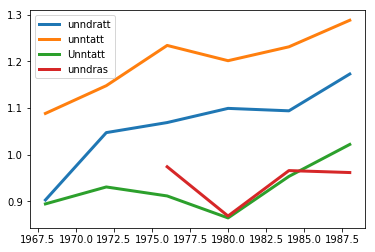

In [202]:
offentlighet.loc[['unndratt', 'unntatt', 'Unntatt', 'unndras']].transpose().plot(lw=3)
plt.savefig('unntagelser_for_offentlighet.jpg', dpi=300)

,offentlighet
full,1.364301
den,1.244021
omkring,1.146085
all,1.142593
amerikanske,1.135438
britiske,1.069591
norske,1.048859
forvaltningen,1.038517
vesttyske,1.030807
om,1.029126


In [204]:
G = nb.make_graph('offentlighet', cutoff = 10)

C:\Users\larsj\AppData\Local\Continuum\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


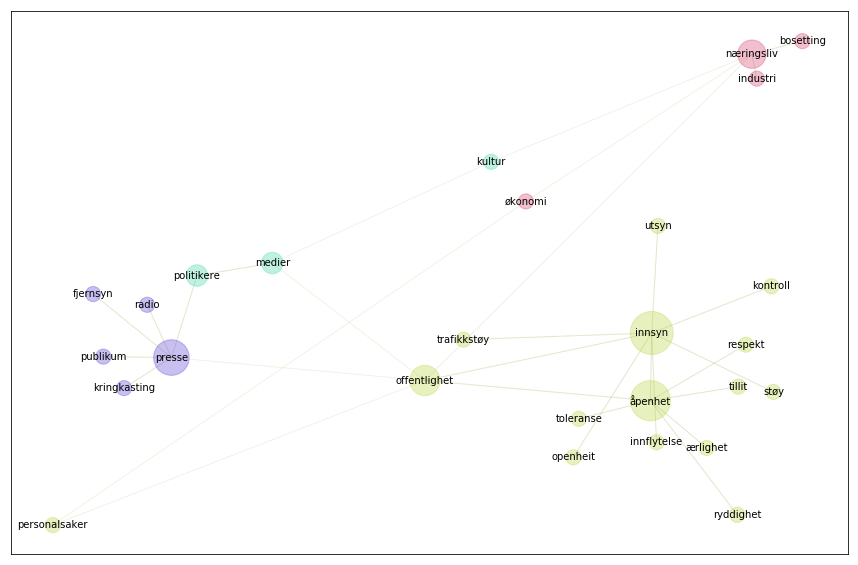

In [205]:
gnl.show_graph(G, spread = 1.3)
plt.savefig('offentlighet.jpg', dpi=300)

In [62]:
G1 = nb.make_graph('Skandinavien', cutoff = 10)

C:\Users\larsj\AppData\Local\Continuum\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


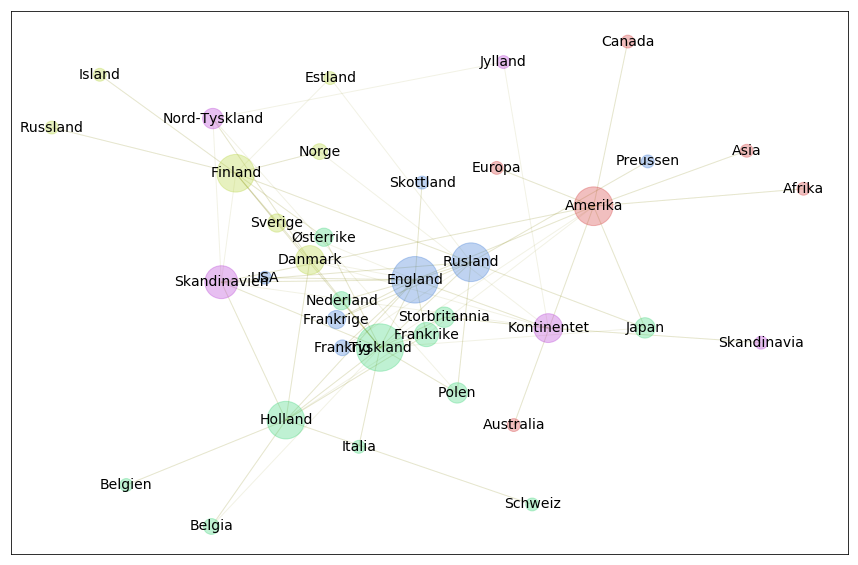

In [65]:
gnl.show_graph(G1, spread = 1.9, fontsize=14)
plt.savefig('Skandinavien.jpg', dpi=300)

In [11]:
G2 = nb.make_graph('Skandinavia, Norden', cutoff = 10)

C:\Users\larsj\AppData\Local\Continuum\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


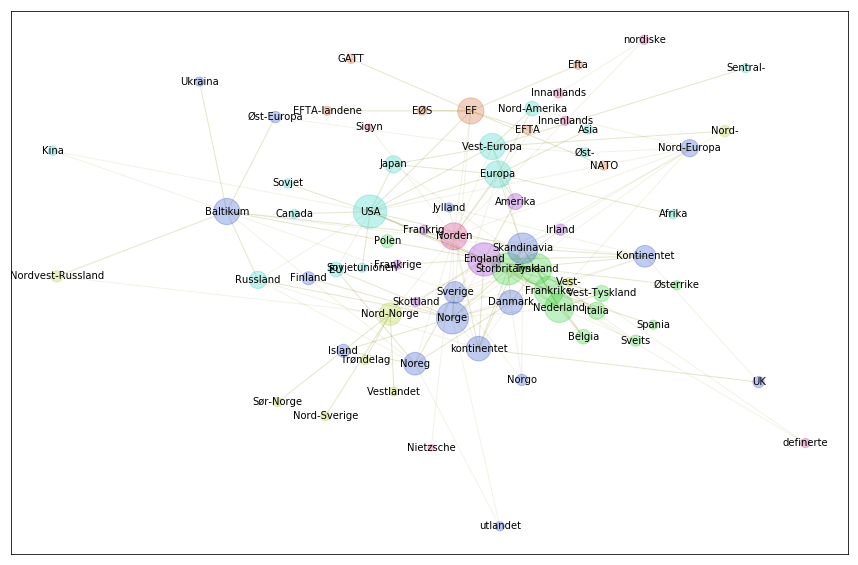

In [12]:
gnl.show_graph(G2, spread = 1.5)

In [13]:
skandinavia = nb.relaterte_ord('Skandinavia', number=50, score=True)

In [207]:
ytringsfrihet = nb.relaterte_ord('ytringsfrihet', number=50, score=True)

In [206]:
offentlighet = nb.relaterte_ord('offentlighet', number=50, score=True)

In [211]:
Offentlighed = nb.relaterte_ord('Offentlighed', number=50, score=True)

In [68]:
norden = nb.relaterte_ord('Norden', number=50, score=True)

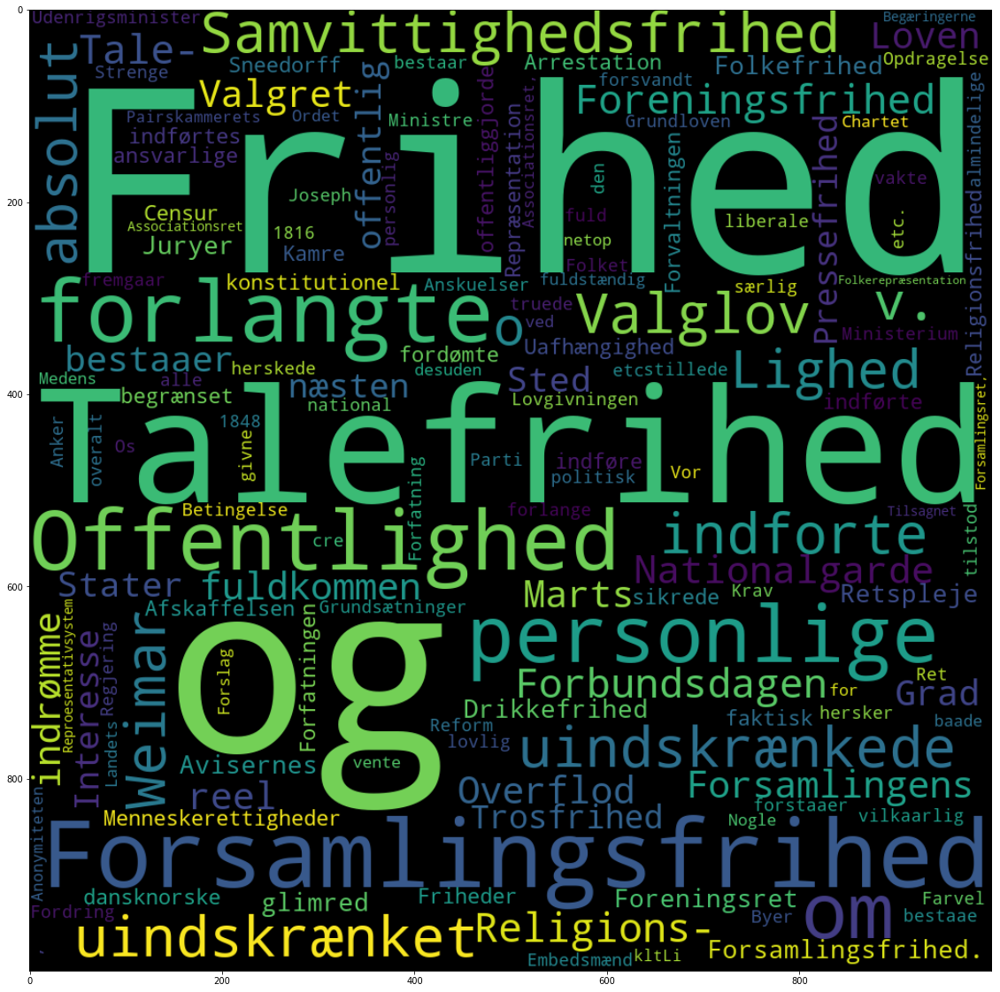

In [38]:
nb.cloud(clustre[(('Pressefrihed', (1800, 1900)), 'bok')].cluster_set(aslist=False, top=150))
plt.savefig('Pressefrihed-bok.jpg', dpi=300)

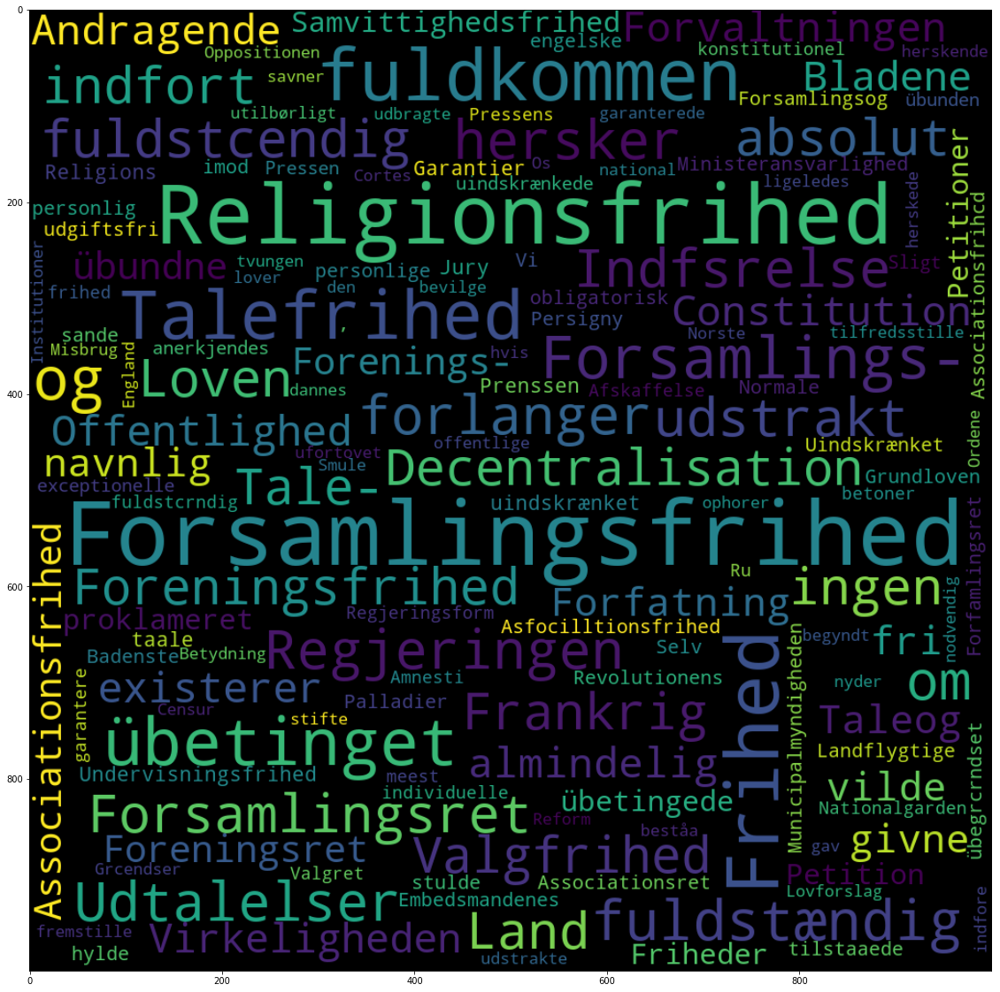

In [37]:
nb.cloud(clustre[(('Pressefrihed', (1800, 1900)), 'avis')].cluster_set(aslist=False, top=150))
plt.savefig('Pressefrihed-avis.jpg', dpi=300)

In [33]:
clustre[(('Trykkefrihed', (1800, 1900)), 'bok')].cluster_set(aslist=False)

,Trykkefrihed
Sted,1.306400
finde,1.284629
Ingen,1.216030
Christensen,1.197783
100.,1.162843
bor,1.136868
bsr,1.123883
bør,1.116336
VII,1.115559
sted,1.110927


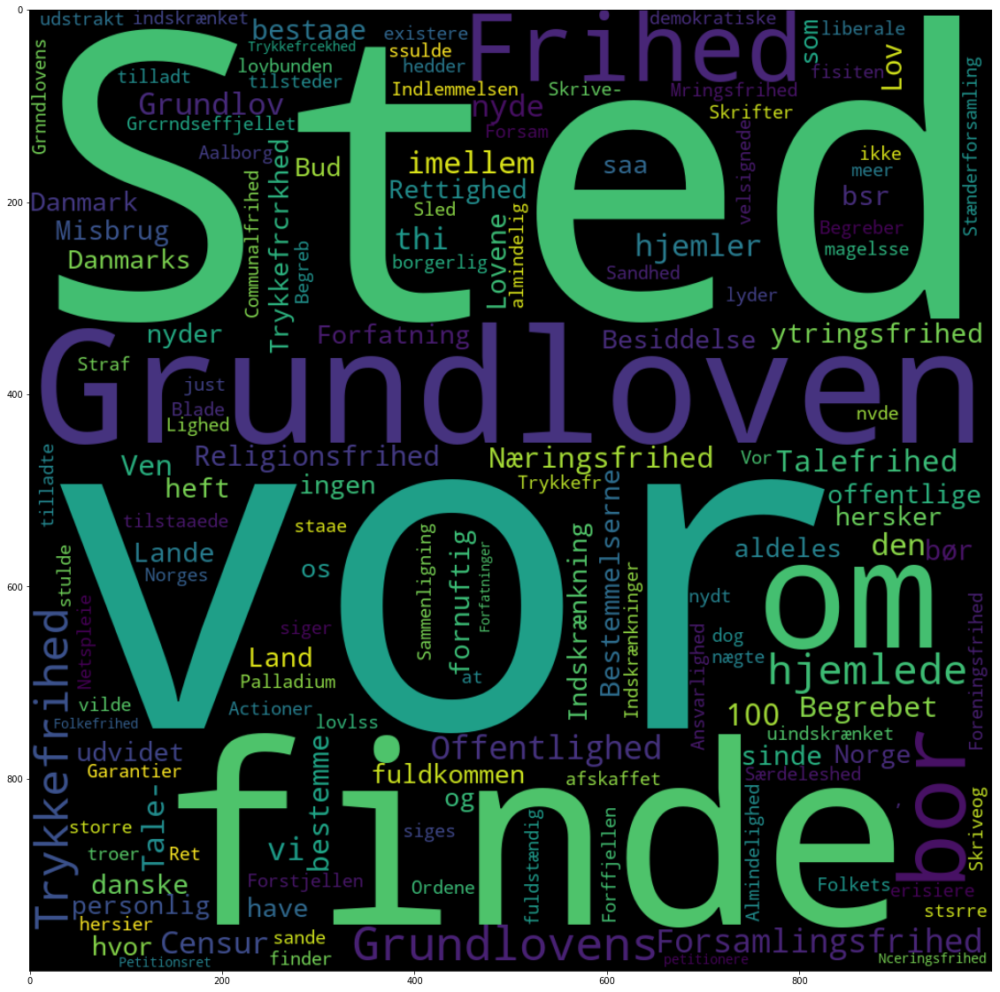

In [25]:
nb.cloud(clustre[(('Trykkefrihed', (1800, 1900)), 'avis')].cluster_set(aslist=False,top=150))
plt.savefig('Trykkefrihed-avis2.jpg', dpi=300)

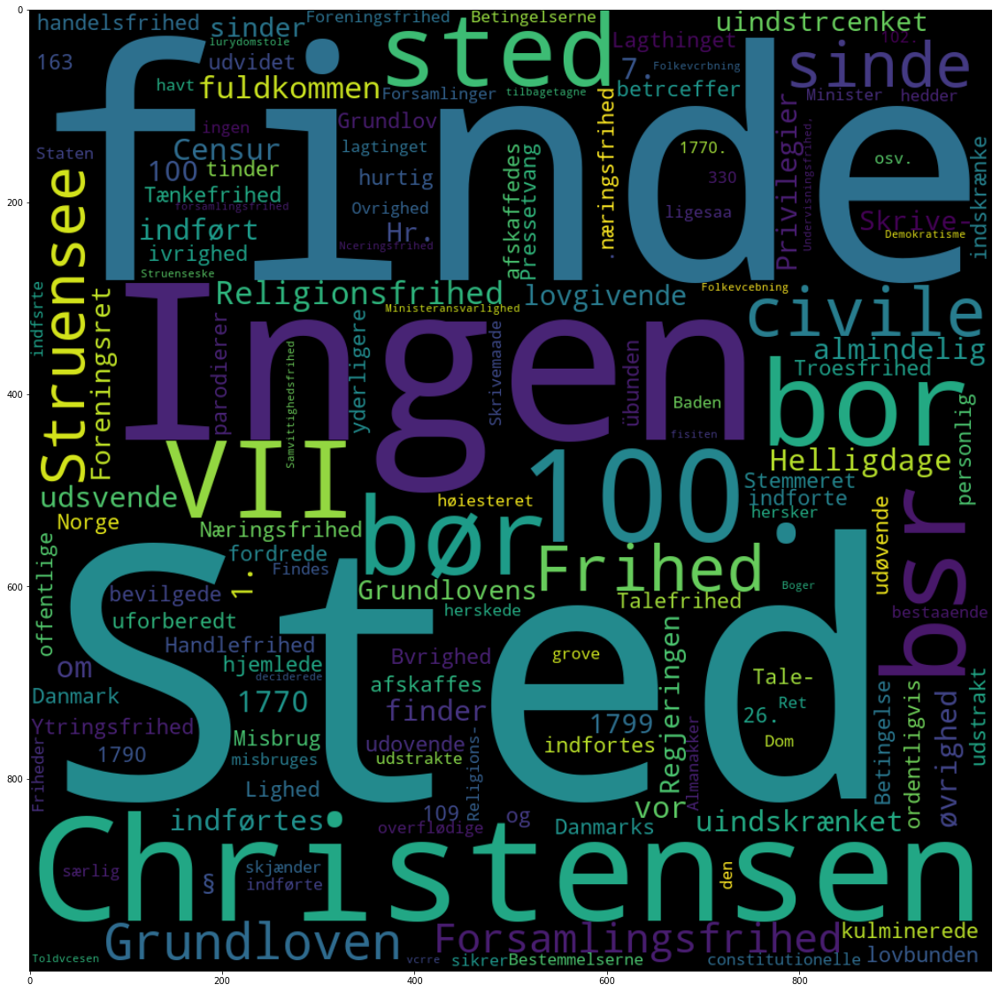

In [23]:
nb.cloud(clustre[(('Trykkefrihed', (1800, 1900)), 'bok')].cluster_set(aslist=False,top=150))
plt.savefig('Trykkefrihed-bok2.jpg', dpi=300)

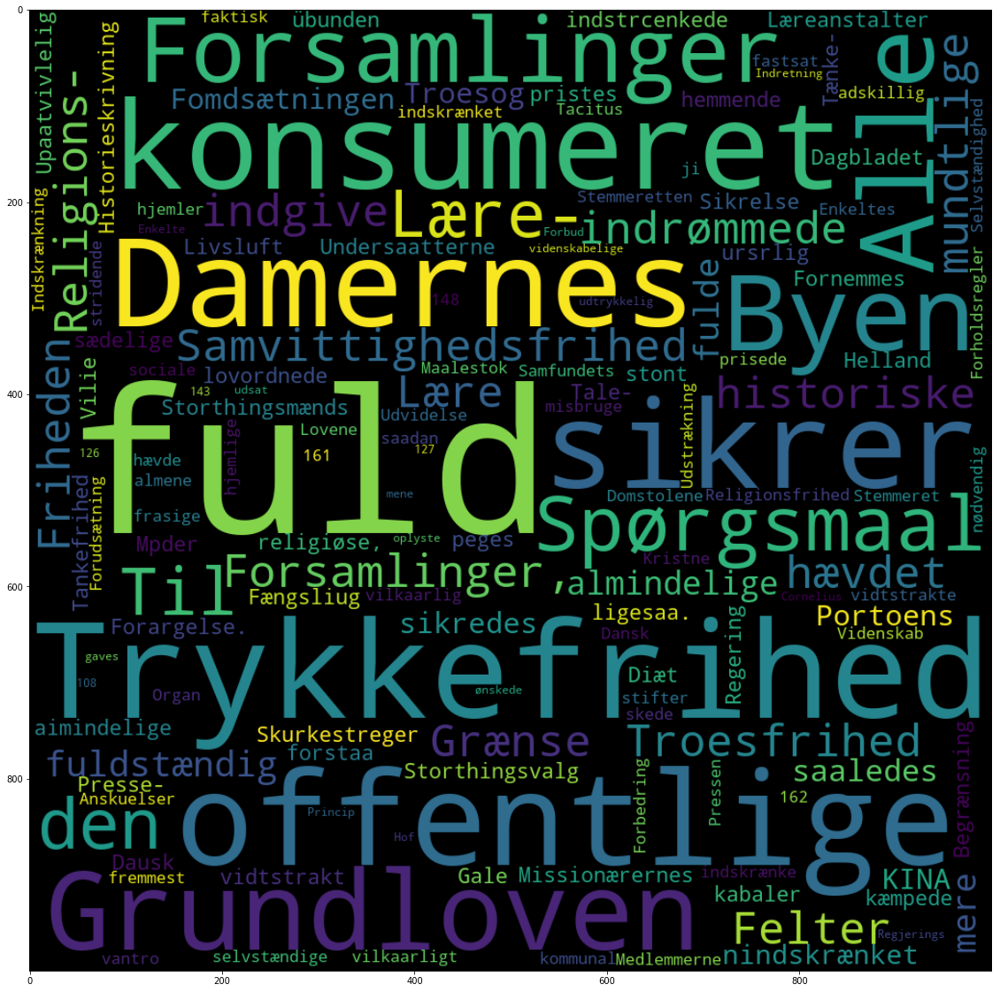

In [44]:
nb.cloud(clustre[(('Ytringsfrihed', (1800, 1900)), 'bok')].cluster_set(aslist=False,top=150))
plt.savefig('Ytringsfrihed-bok.jpg', dpi=300)

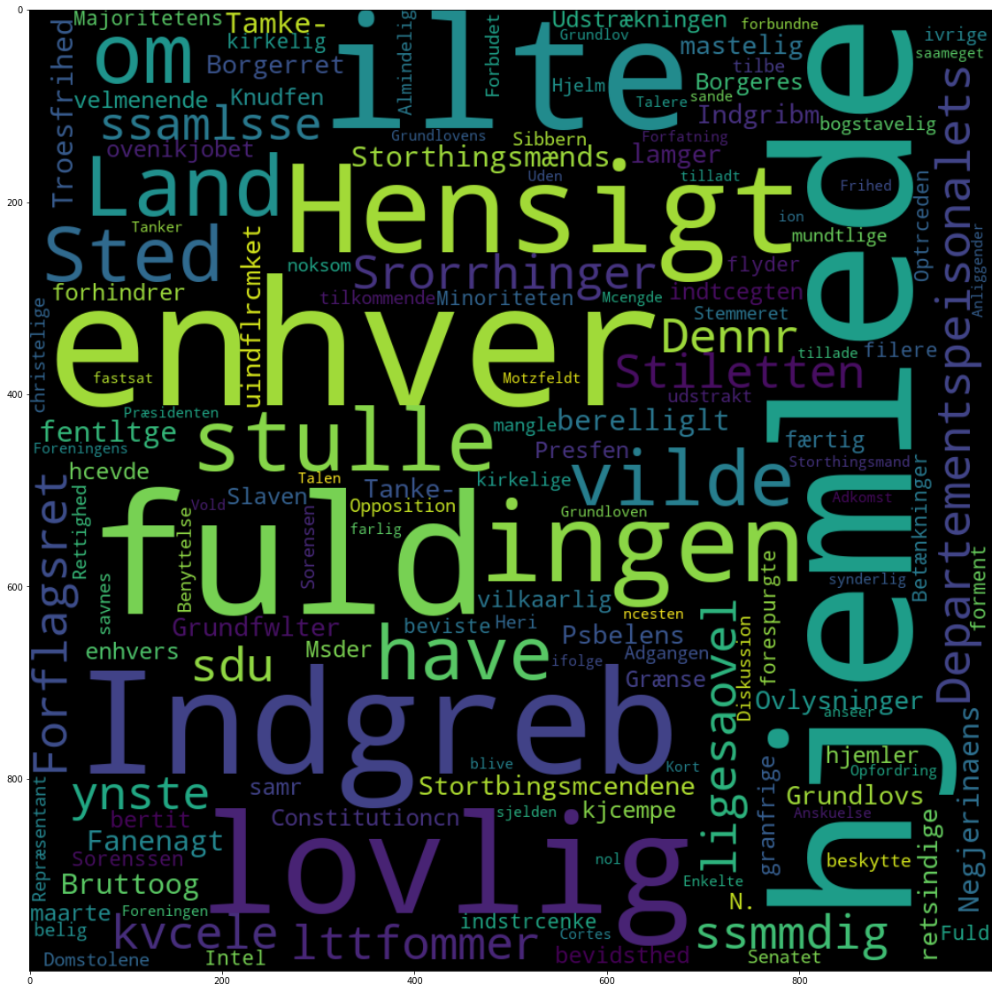

In [46]:
nb.cloud(clustre[(('Ytringsfrihed', (1800, 1900)), 'avis')].cluster_set(aslist=False,top=150))
plt.savefig('Ytringsfrihed-avis.jpg', dpi=300)

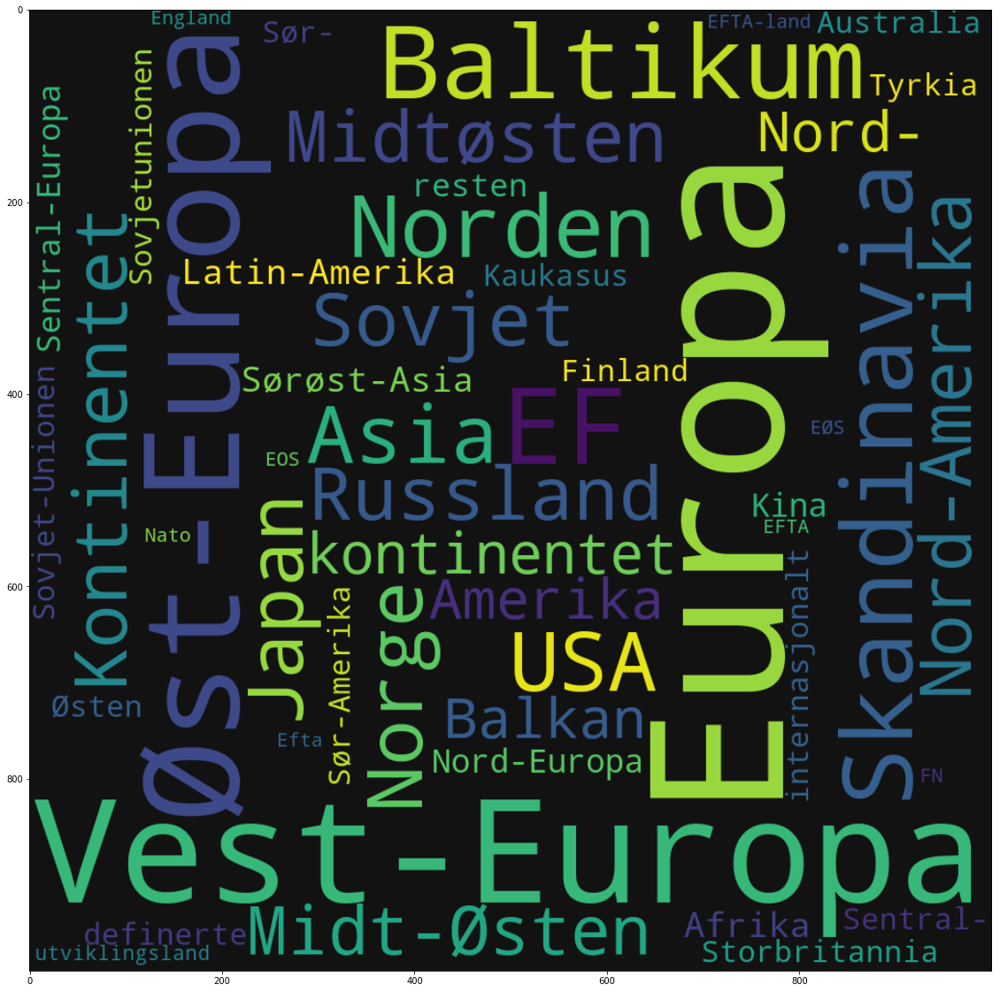

In [70]:
nb.cloud(nb.frame(dict(norden)), background='#121212')
plt.savefig('norden_ordsky.jpg', dpi=300)

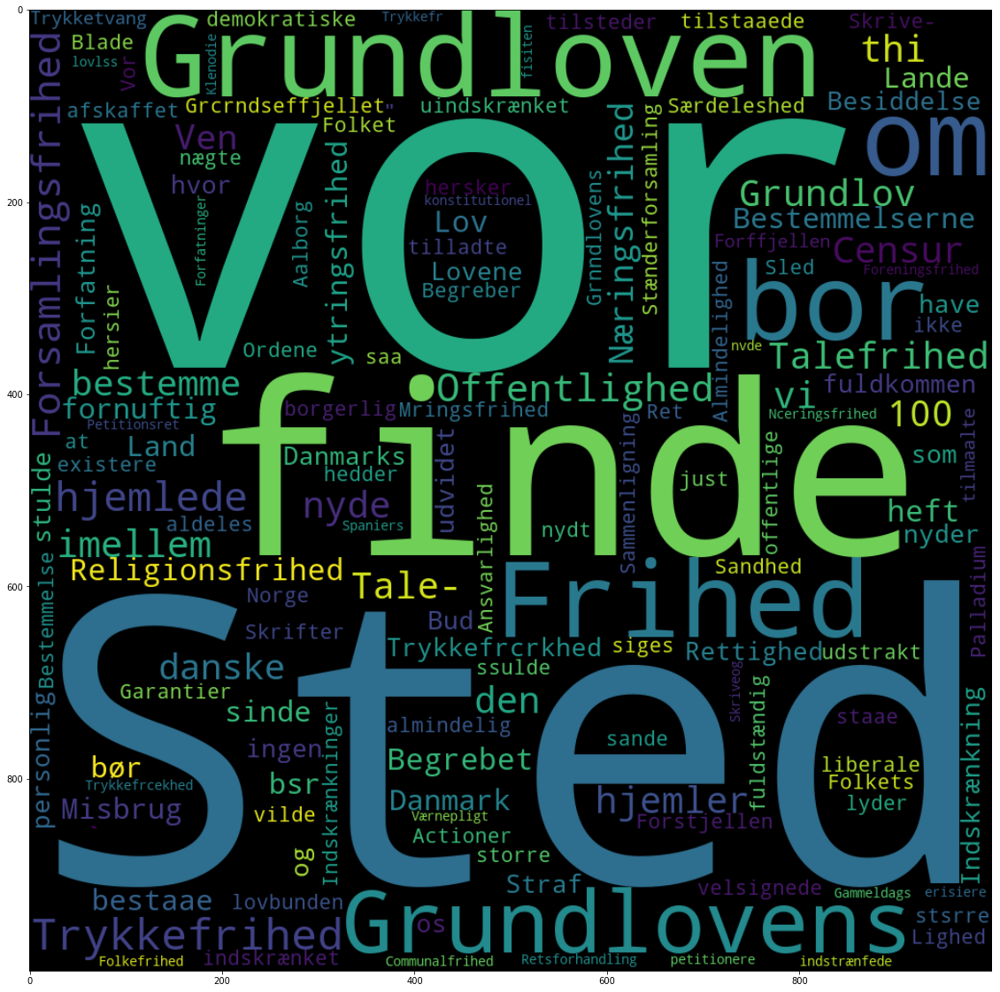

In [45]:
nb.cloud(clustre[(('Trykkefrihed', (1800, 1900)), 'avis')].cluster_set(aslist=False,top=150))
plt.savefig('Trykkefrihed-avis.jpg', dpi=300)

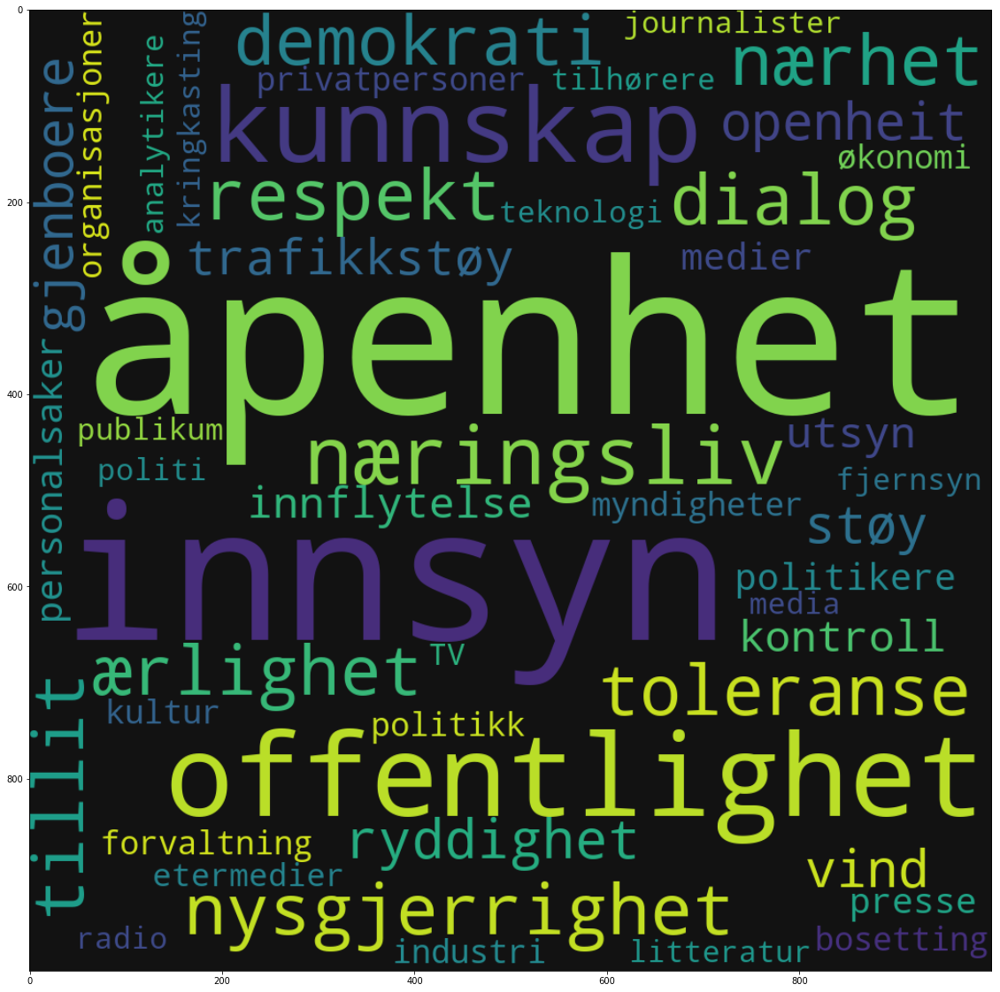

In [208]:
nb.cloud(nb.frame(dict(offentlighet)), background='#121212')
plt.savefig('offentlighet_ordsky.jpg', dpi=300)

In [228]:
data[:10]

,Offentlighed
Mundtlighed,0.006413
give,0.006274
Forhandlingernes,0.006246
den,0.006229
mulige,0.006098
fuld,0.006020
Forhandlinger,0.005858
Sagen,0.005845
storst,0.005839
Kontrol,0.005785


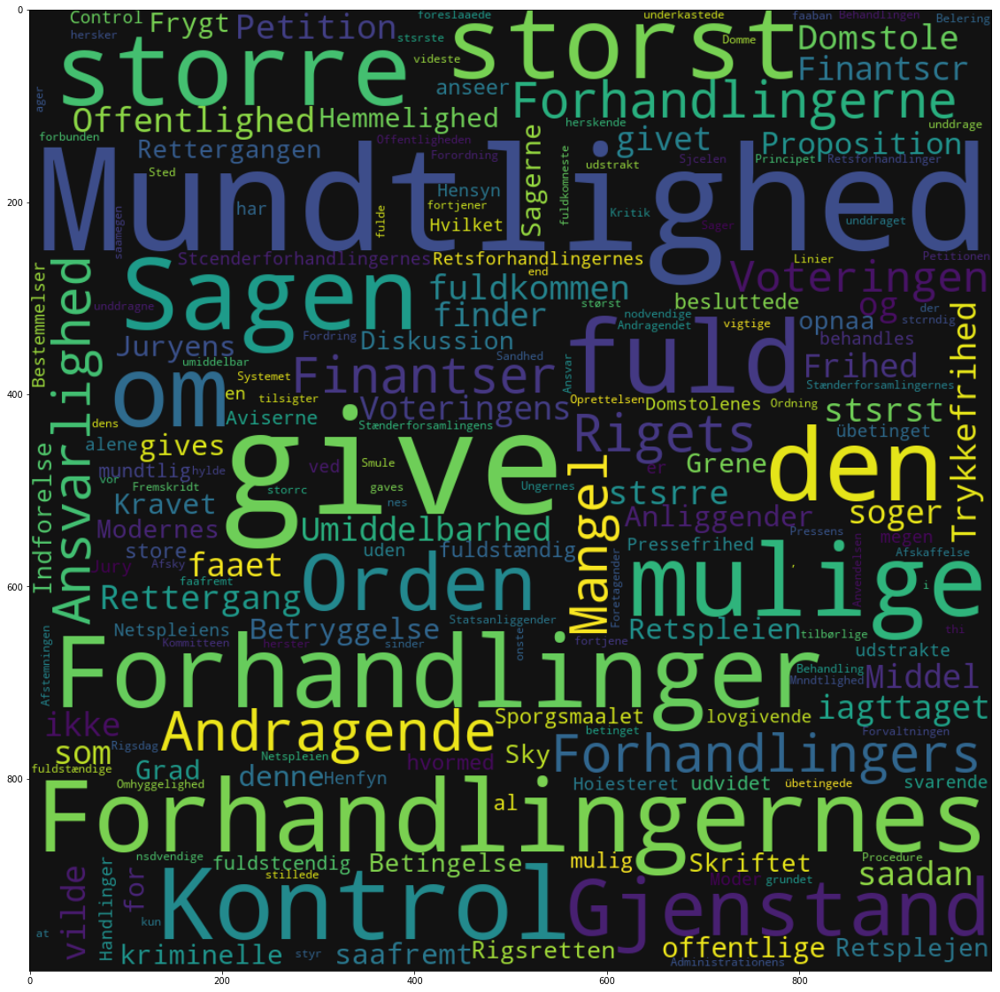

In [232]:
nb.cloud(data, background='#121212')
plt.savefig('Offentlighed_cluster_ordsky.jpg', dpi=300)

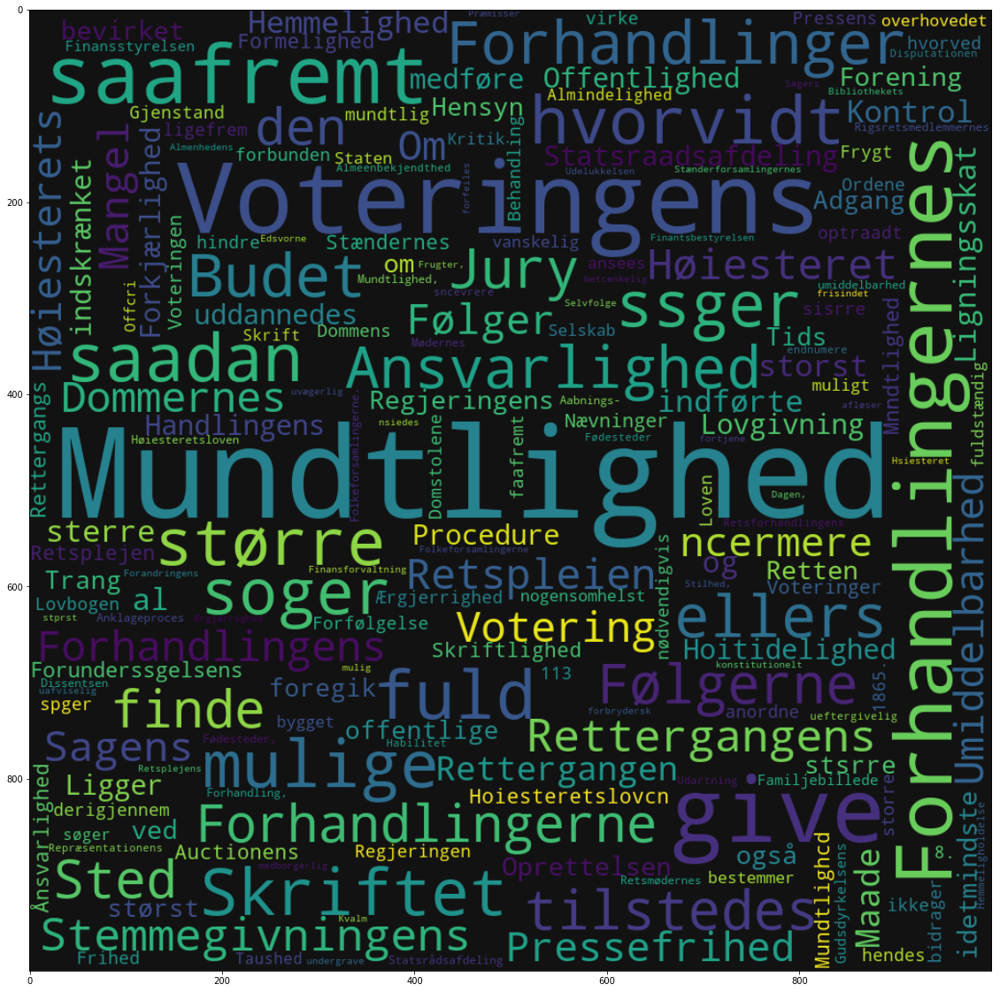

In [236]:
nb.cloud(Off_bok.cluster_set(aslist=False), background='#121212')
plt.savefig('Offentlighed_bokcluster_ordsky.jpg', dpi=300)

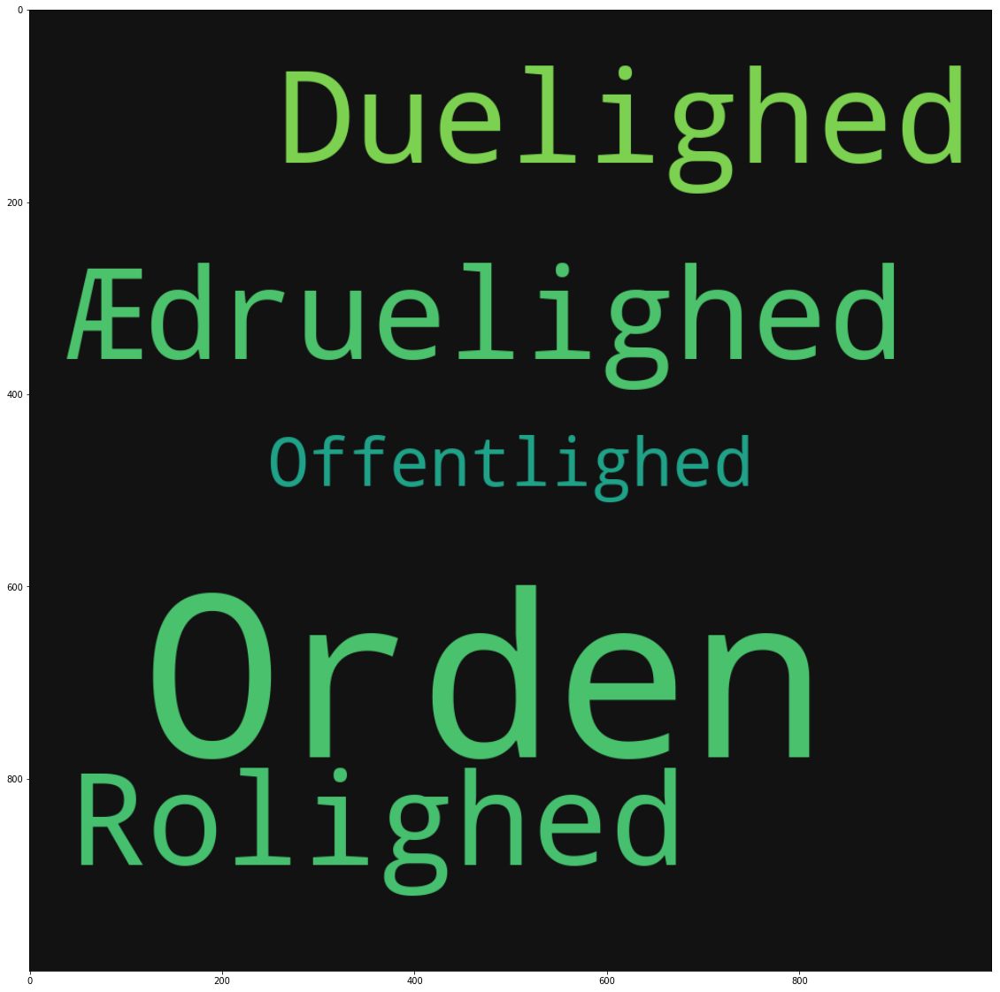

In [213]:
nb.cloud(nb.frame(dict(Offentlighed)), background='#121212')
plt.savefig('Offentlighed_ordsky.jpg', dpi=300)

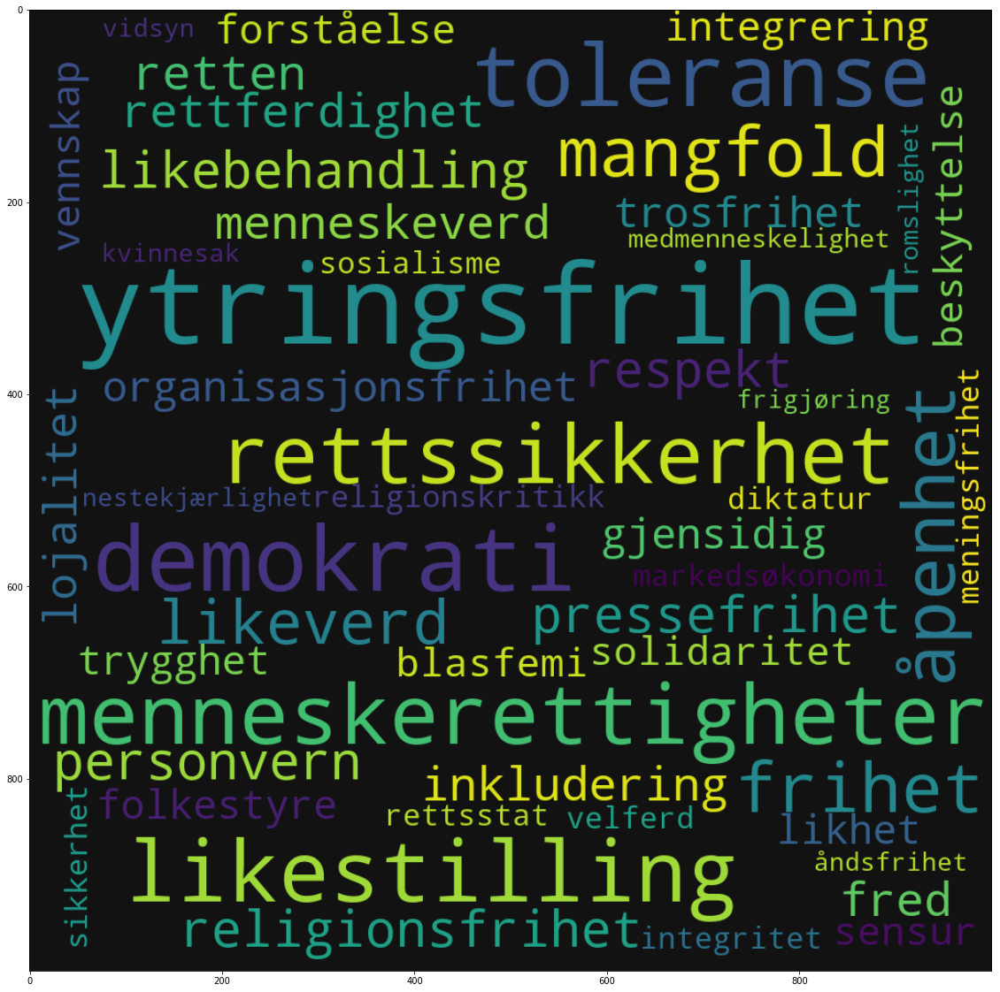

In [209]:
nb.cloud(nb.frame(dict(ytringsfrihet)), background='#121212')
plt.savefig('ytringsfrihet_ordsky.jpg', dpi=300)

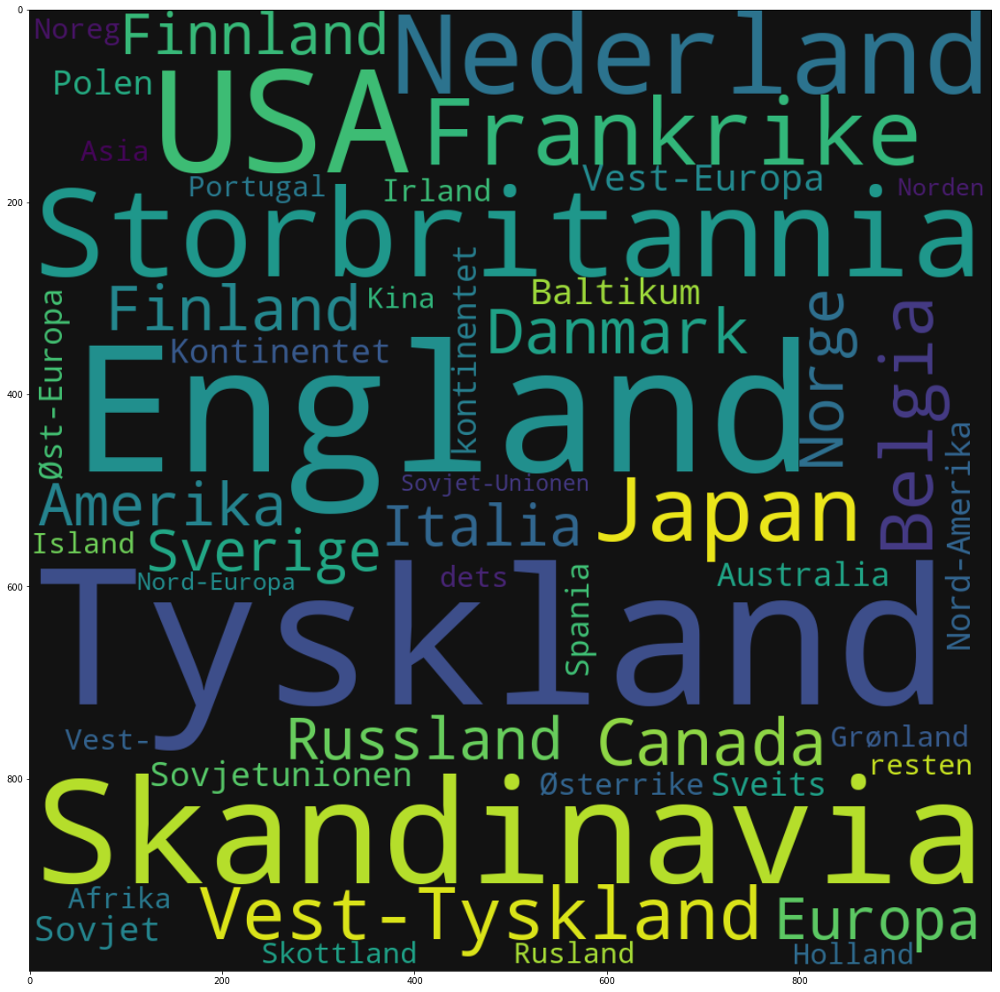

In [71]:
nb.cloud(nb.frame(dict(skandinavia)), background='#121212')
plt.savefig('skandinavia.jpg', dpi=300)

In [17]:
korp_norden = nb.get_urn({'words':['Norden','Nordisk','Nordiske'], 'year':1800, 'next':100, 'limit':200})

In [18]:
ref_1800 = nb.get_urn({'year':1800, 'next':100, 'limit':200})

In [19]:
total = nb.get_aggregated_corpus(ref_1800)

In [20]:
import pandas as pd

In [21]:
totalen = pd.Series(nb.totals(50000))

In [22]:
coll_norden = nb.urn_coll('Norden', urns=korp_norden, before=5, after=5)

In [23]:
(coll_norden[0]/totalen).sort_values( ascending=False)

Syden            0.000960
Familien         0.000290
Munthe           0.000290
Legat            0.000183
Donau            0.000167
Porte            0.000148
fundne           0.000141
Odins            0.000133
Osten            0.000125
Westen           0.000121
udbredt          0.000111
skandinaviske    0.000110
iscrr            0.000107
Reise            0.000098
Udbredelse       0.000097
yderste          0.000093
Enhed            0.000090
Vesten           0.000089
hsit             0.000087
høje             0.000086
godes            0.000085
foljande         0.000084
angive           0.000082
Bjerget          0.000082
Asien            0.000080
Norwegen         0.000080
Schweden         0.000080
Bjerge           0.000077
overste          0.000077
Bde              0.000077
                   ...   
übft                  NaN
übi                   NaN
übrcrndte             NaN
übrigen               NaN
übrigens              NaN
übrukelig             NaN
übrukelige            NaN
übrukt      

In [24]:
norden = nb.Cluster(word='Norden', period=(1850, 1920))

In [25]:
norden30 = nb.Cluster(word='Norden', period=(1920, 1930))

In [26]:
norden30.cluster_set()

In [27]:
norden.cluster_set(exponent=1.2)

# Bygg med biblioteksdata

In [28]:
korpus = nb.get_urn({'ddk':"641%", 'limit':50})
korpus[:5]

[[2011030108026, 'Uffe', 'Helt rått', 2000],
 [2009011900026, 'Rinker, Eva Haukeberg', 'Tex-Mex', 1997],
 [2013062038072, 'Lousada, Patricia', 'Tidens lille konfektbok', 1985],
 [2016022548133, 'Jackson, Michael', 'Maltwhisky', 2000],
 [2014062307155, '', 'Halloween', 2000]]

Ta et uttrekk av setninger

In [29]:
Sentences = nb.sentences(korpus, num = 1000)
Sentences[:10]

['Så tilsettes smør , sukker , salt og saften av 1 / 2 sitron , og sausen beveges over varmen til smøret er fullstendig smeltet',
 'Rør gradvis inn marengsmassen , en skje av gangen , og til alt er godt blandet',
 'Bland dette godt sammen til osten nesten ikke merkes i deigen , omtrent ti minutter for hånd eller fem minutter i maskin',
 'Dietter som har gått i arv gjennom generasjoner , har vist seg å være bra , ihvertfall til en viss grad - man har jo tross alt overlevd på dem',
 'Pynt med en mandarinbåt og et halvt cocktailbær',
 'Kapittel 3',
 'De er så uregelmessige i formen at skrellingen nødvendigvis blir tidkrevende',
 'MALTOSE',
 'Bruk samme fremgangsmåte til den mørke deigen',
 'Tilsett kulene i fiskekraften og rør til sausen blir jevn og glatt']

Setningene er ferdig tokenisert, så en .split() holder for å hente ut tokener.

In [30]:
SCount = Counter()
for s in Sentences:
    SCount.update(s.split())

Se på de mest frekvente

In [31]:
SCount.most_common(10)

[(',', 417),
 ('og', 407),
 ('i', 277),
 ('med', 180),
 ('en', 160),
 ('er', 150),
 ('til', 136),
 ('på', 131),
 ('av', 124),
 ('som', 102)]

Sammenlign med totalen av ord

In [32]:
# den her tar litt tid ...
tot = nb.totals(top=20000)

Inneholder alle ordene fra bøker i NB-digital

In [33]:
totalen = nb.frame(tot)
totalen.head()

,0
.,1265723110
",",1105303412
og,543432056
i,460246057
det,273411583


In [34]:
df_SCount = nb.frame(SCount).sort_values(by= 0, ascending=False)
df_SCount.head()

,0
",",417
og,407
i,277
med,180
en,160


In [35]:
diff = (df_SCount/totalen).sort_values(by=0, ascending = False)
diff.head()

,0
Skjær,0.000123
Server,0.000120
Smør,0.000099
Bland,0.000098
Tilsett,0.000096


## Tegn ordsky av resultatet

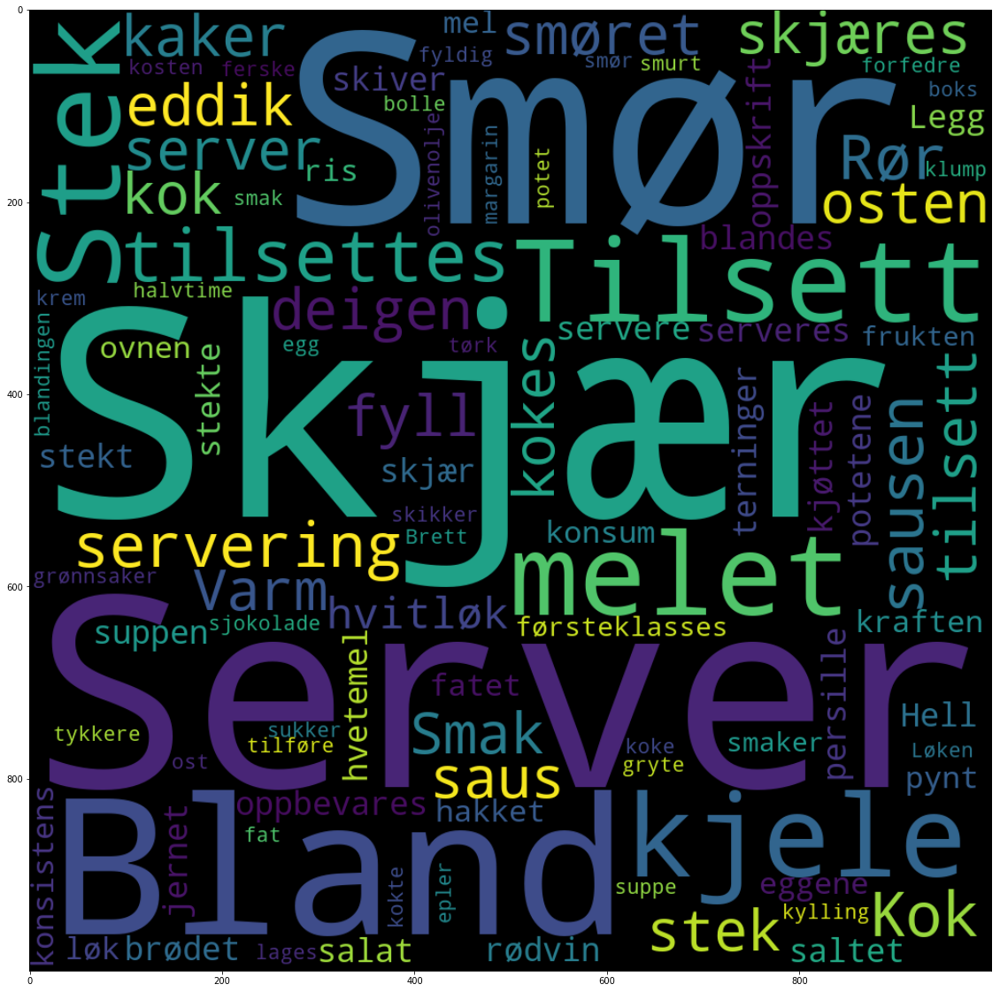

In [36]:
nb.cloud(diff[:100])

In [37]:
isdiff = (coll/totalen).sort_values(by=0, ascending = False)
isdiff.head(20)

NameError: name 'coll' is not defined

# Dokument-term-matriser

In [ ]:
# hent term-matrisen med kommandoen nb.get_corpus_text( ... liste av urner ...)
dtm = nb.get_corpus_text([x[0] for x in _27])

In [ ]:
nb.heatmap(dtm.sort_values(by = dtm.columns[1], ascending = False)[:50])

# Analyse - viktigste ord

In [ ]:
korpus = nb.Corpus(ddk='641%', period = (1990, 2010))

In [ ]:
korpus.difference(doc_exp = 1.1, freq_exp = 1.1)

In [ ]:
nb.cloud(korpus.difference(doc_exp=1.1, freq_exp=1.1, aslist=False)[:100])

In [ ]:
korpus1 = nb.Corpus(ddk='700%', period = (1990, 2010))

In [ ]:
korpus1.difference(doc_exp = 1.1, freq_exp = 1.1)

In [ ]:
nb.cloud(korpus1.difference(doc_exp=1.1, freq_exp=1.1, aslist=False)[:100])

In [ ]:
korpus2 = nb.Corpus(ddk='230%', period = (1990, 2010))

In [ ]:
korpus2.difference(doc_exp = 1.1, freq_exp = 1.1)

In [ ]:
nb.cloud(korpus2.difference(doc_exp=1.1, freq_exp=1.1, aslist=False)[:100])

In [ ]:
korpus3 = nb.Corpus(ddk='004%', period = (1990, 2010))

In [ ]:
nb.cloud(korpus3.difference(doc_exp=1.1, freq_exp=1.1, aslist=False)[:100])